<a href="https://colab.research.google.com/github/ankitrajmehta/asl-handsigns/blob/main/colab_implementation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!git clone https://github.com/ankitrajmehta/asl-handsigns.git

Cloning into 'asl-handsigns'...
remote: Enumerating objects: 18, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (14/14), done.
remote: Total 18 (delta 6), reused 11 (delta 2), pack-reused 0
Receiving objects: 100% (18/18), 2.17 MiB | 6.97 MiB/s, done.
Resolving deltas: 100% (6/6), done.


In [ ]:
!pip install pyarrow

In [7]:
import os
import pyarrow
from google.colab.patches import cv2_imshow


In [ ]:
os.chdir('/content/asl-handsigns')

In [ ]:
!ls

app.py	demo.mp4  output.parquet  README.md  xyz_df.csv


In [ ]:
!pip install mediapipe

In [ ]:

!pip install tflite-runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 8.3 MB/s eta 0:00:00


In [34]:

# !pip install tflite-runtime
import tflite_runtime.interpreter as tflite

import pandas as pd
import numpy as np
import cv2
import mediapipe as mp
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
import PIL.Image
import tflite_runtime.interpreter as tflite

mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_holistic = mp.solutions.holistic

ROWS_PER_FRAME = 543  # number of landmarks per frame

def load_relevant_data_subset(pq_path):
    data_columns = ['x', 'y', 'z']
    data = pd.read_parquet(pq_path, columns=data_columns)
    n_frames = int(len(data) / ROWS_PER_FRAME)
    data = data.values.reshape(n_frames, ROWS_PER_FRAME, len(data_columns))
    return data.astype(np.float32)


def create_frame_landmark_df(results,frame,xyz_skel):
  face = pd.DataFrame()
  pose = pd.DataFrame()
  left_hand = pd.DataFrame()
  right_hand = pd.DataFrame()
  if results.face_landmarks is not None:
    for i, point in enumerate(results.face_landmarks.landmark):
      face.loc[i, 'x'] = point.x
      face.loc[i, 'y'] = point.y
      face.loc[i, 'z'] = point.z
  if results.pose_landmarks is not None:
    for i, point in enumerate(results.pose_landmarks.landmark):
      pose.loc[i, 'x'] = point.x
      pose.loc[i, 'y'] = point.y
      pose.loc[i, 'z'] = point.z
  if results.left_hand_landmarks is not None:
    for i, point in enumerate(results.left_hand_landmarks.landmark):
      left_hand.loc[i, 'x'] = point.x
      left_hand.loc[i, 'y'] = point.y
      left_hand.loc[i, 'z'] = point.z
  if results.right_hand_landmarks is not None:
    for i, point in enumerate(results.right_hand_landmarks.landmark):
      right_hand.loc[i, 'x'] = point.x
      right_hand.loc[i, 'y'] = point.y
      right_hand.loc[i, 'z'] = point.z

  face = face.reset_index().rename(columns={'index': 'landmark_index'}).assign(type='face')
  pose = pose.reset_index().rename(columns={'index': 'landmark_index'}).assign(type='pose')
  left_hand = left_hand.reset_index().rename(columns={'index': 'landmark_index'}).assign(type='left_hand')
  right_hand = right_hand.reset_index().rename(columns={'index': 'landmark_index'}).assign(type='right_hand')
  landmarks = pd.concat([face, pose, left_hand, right_hand]).reset_index(drop=True)
  landmarks = xyz_skel.merge(landmarks, on = ['type','landmark_index'], how = 'left')
  landmarks = landmarks.assign(frame=frame)
  return landmarks


In [70]:
def pred_fn():

  interpreter = tflite.Interpreter('/content/model_new.tflite')
  found_signatures = list(interpreter.get_signature_list().keys())
  prediction_fn = interpreter.get_signature_runner("serving_default")
  return prediction_fn


In [36]:
def predict(xyz___, prediction_fn, ORD2SIGN):
  prediction = prediction_fn(inputs = xyz___)
  pred = prediction['outputs'].argmax()
  sign = ORD2SIGN[pred]

  return sign,prediction['outputs'][pred]

In [37]:
def capture_sign():
  pass

In [50]:

def caturing_video(xyz):
    all_landmarks = []
    video_path = "/content/HAT.mp4"
    cap = cv2.VideoCapture(video_path)

    with mp_holistic.Holistic(min_detection_confidence=0.5, min_tracking_confidence=0.5) as holistic:
        frame = 0
        while cap.isOpened():
            frame += 1
            success, image = cap.read()
            if not success:
                print("End of video.")
                break

            image.flags.writeable = False
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            results = holistic.process(image)

            landmarks_df = create_frame_landmark_df(results, frame, xyz)
            all_landmarks.append(landmarks_df)

            # Draw landmark annotation on the image.
            image.flags.writeable = True
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            mp_drawing.draw_landmarks(
                image,
                results.face_landmarks,
                mp_holistic.FACEMESH_CONTOURS,
                landmark_drawing_spec=None,
                connection_drawing_spec=mp_drawing_styles
                .get_default_face_mesh_contours_style())
            mp_drawing.draw_landmarks(
                image,
                results.pose_landmarks,
                mp_holistic.POSE_CONNECTIONS,
                landmark_drawing_spec=mp_drawing_styles
                .get_default_pose_landmarks_style())
            # Flip the image horizontally for a selfie-view display.
            #cv2.imshow('MediaPipe Holistic', cv2.flip(image, 1))
            cv2_imshow(image)
            if cv2.waitKey(5) & 0xFF == 27:
              break
            # Create landmark dataframe
    cap.release()
    all_landmarks_df =  pd.concat(all_landmarks).reset_index(drop=True)
    return all_landmarks_df

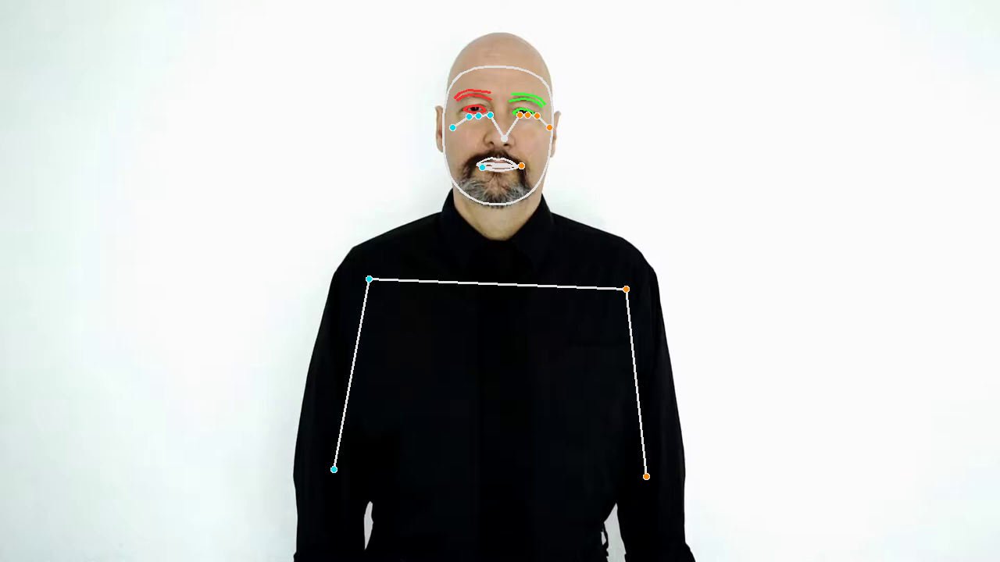

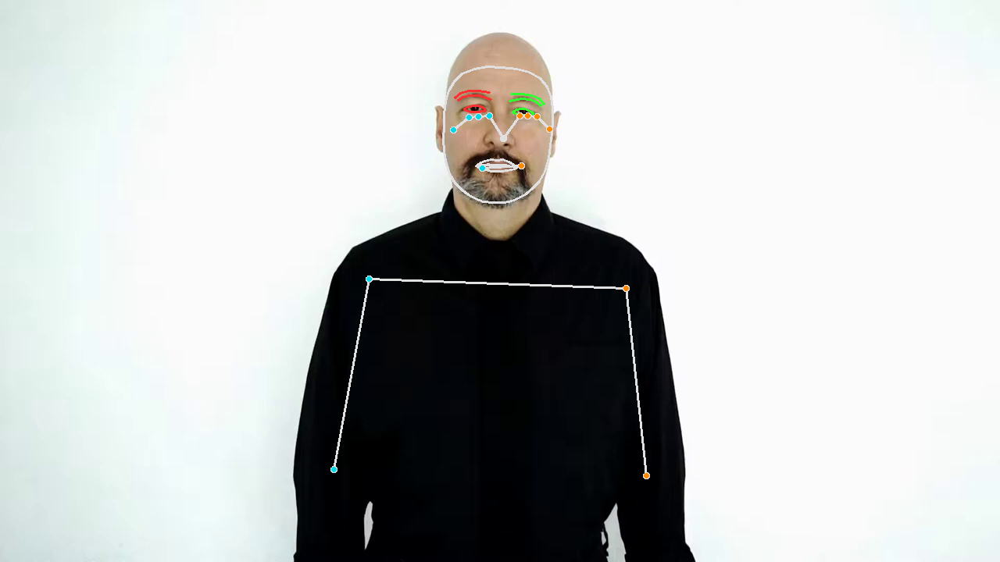

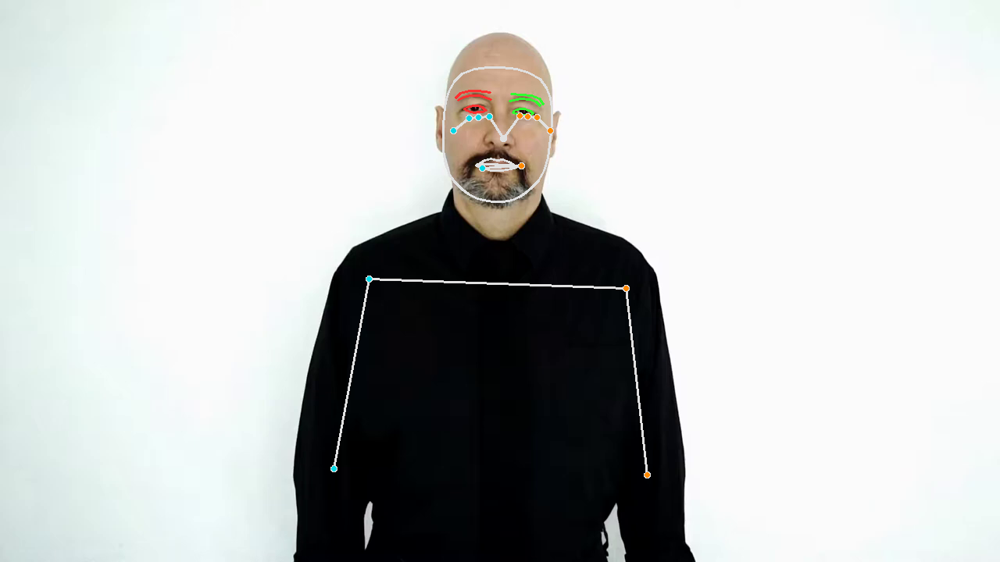

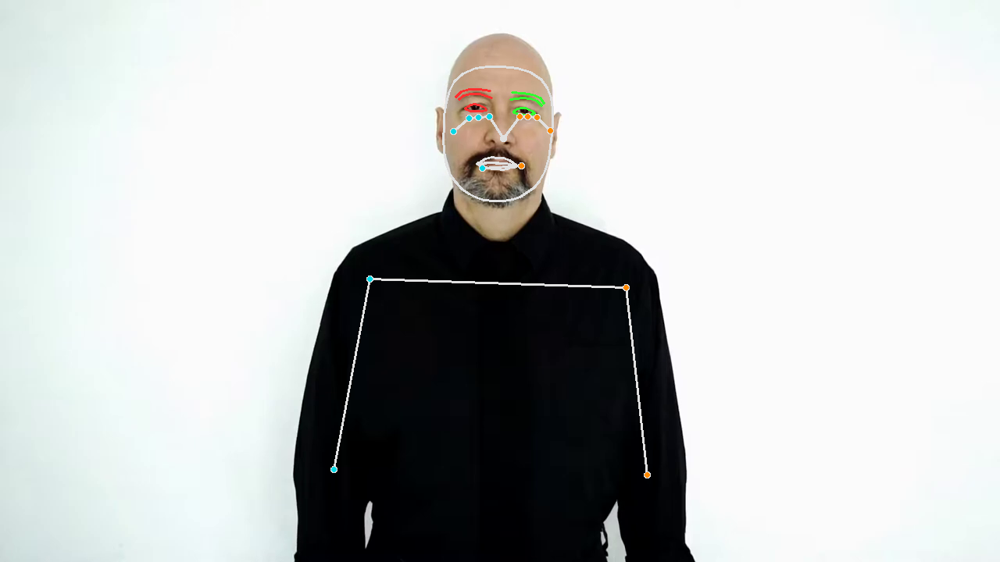

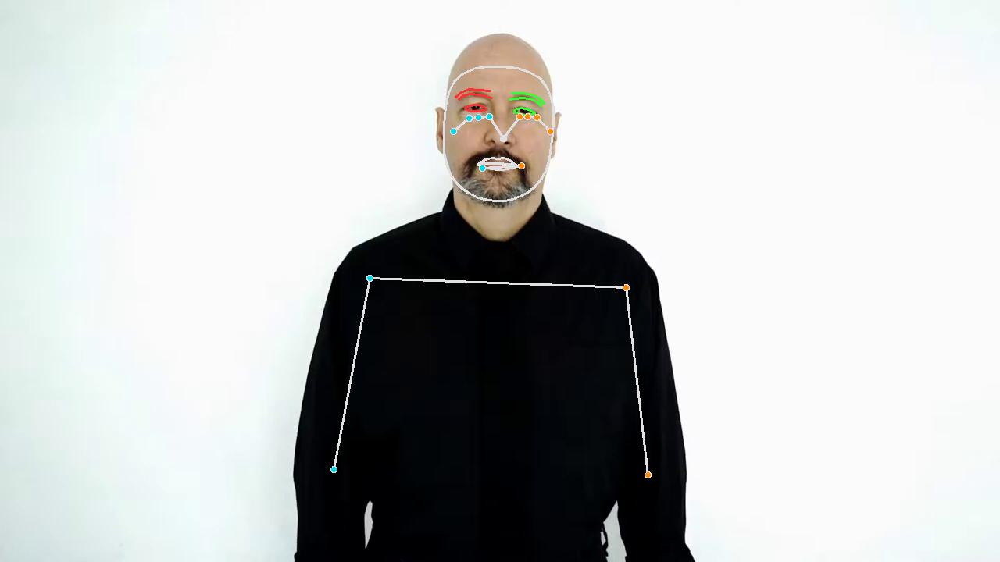

...

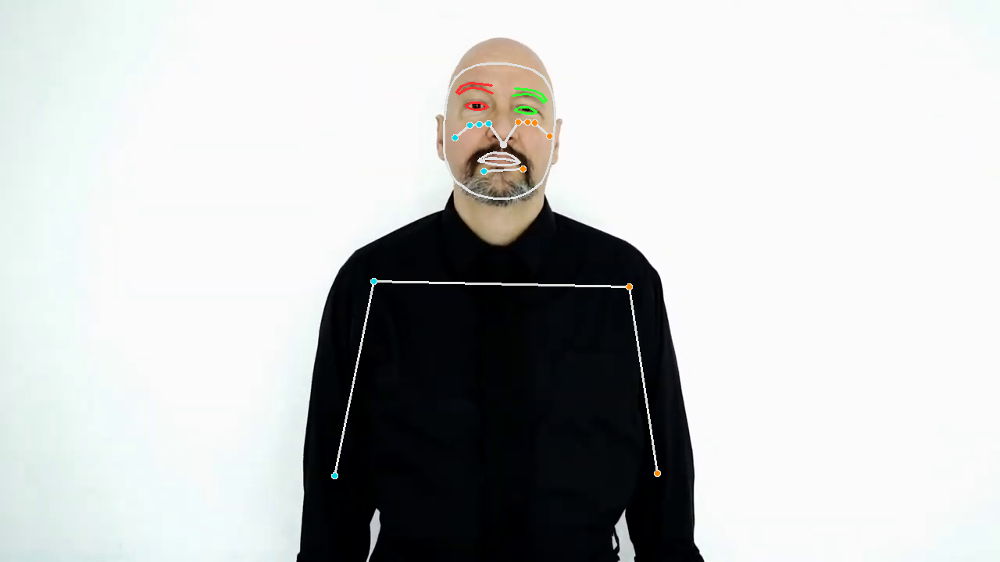

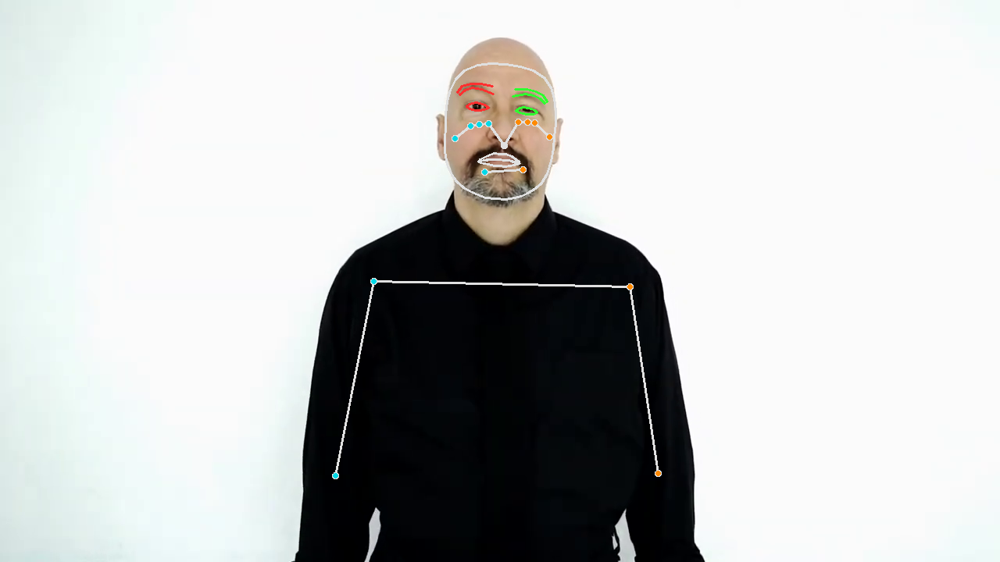

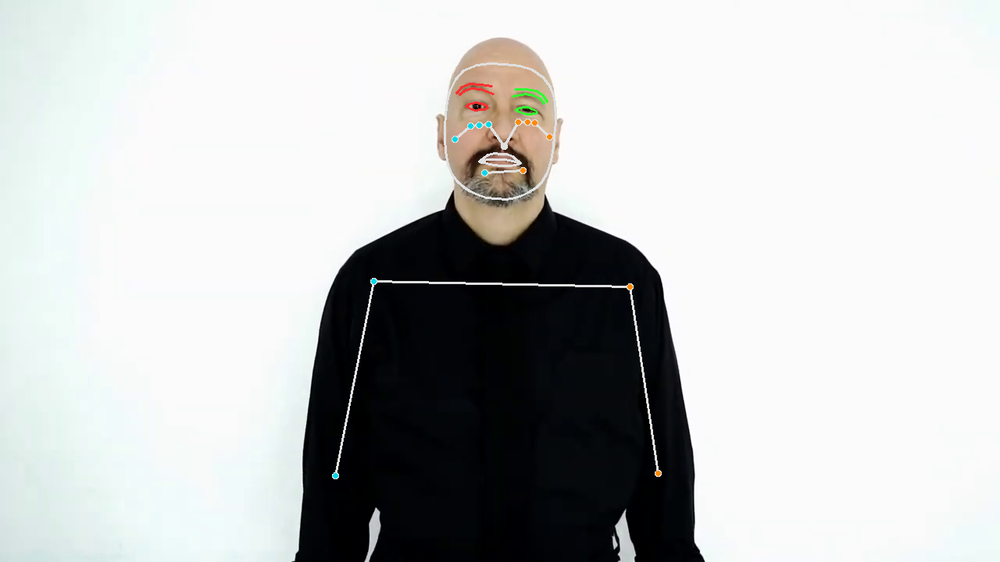

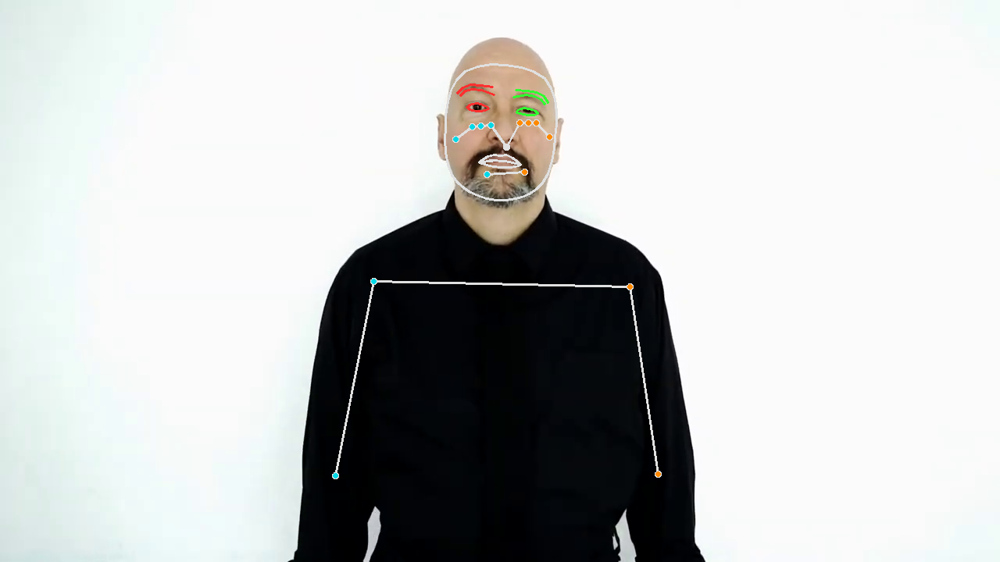

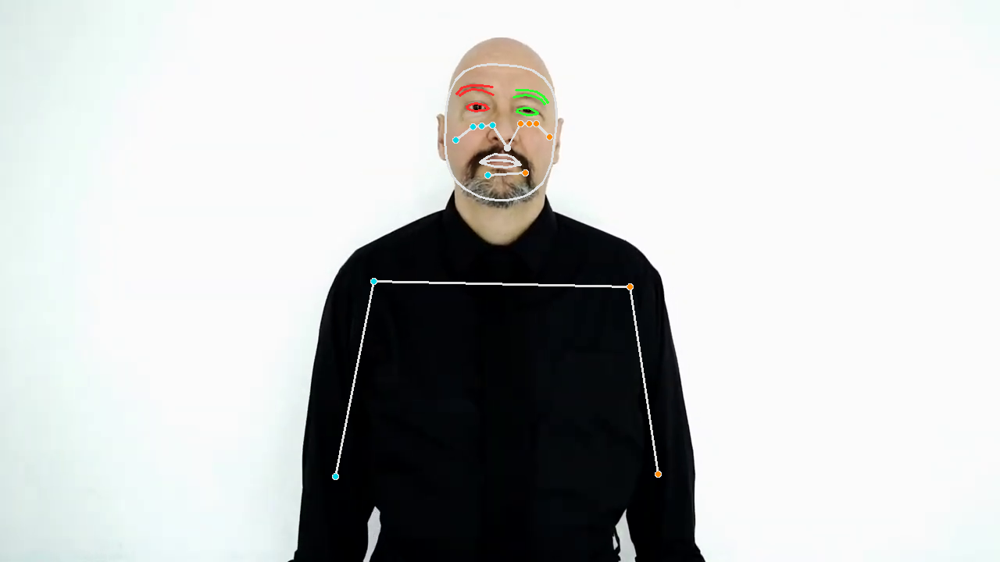

End of video.


In [51]:
xyz = pd.read_csv("/content/asl-handsigns/xyz_df.csv")
xyz_skel = xyz[['type','landmark_index']].drop_duplicates().drop_duplicates().reset_index(drop=True).copy()

landmarks = caturing_video(xyz_skel)

In [19]:
#For training vid test
xyz_np = load_relevant_data_subset('/content/clown.parquet')

In [71]:
landmarks.to_parquet('output.parquet')

train = pd.read_csv('/content/train.csv')
# Dictionaries to translate sign <-> ordinal encoded sign
SIGN2ORD = train[['sign', 'sign_ord']].set_index('sign').squeeze().to_dict()
ORD2SIGN = train[['sign_ord', 'sign']].set_index('sign_ord').squeeze().to_dict()
prediction_fn = pred_fn()

xyz_npp = load_relevant_data_subset('output.parquet')

sign, confidence = predict(xyz_npp, prediction_fn, ORD2SIGN)

In [72]:
sign, confidence

('hat', 9.549401)